---
layout: post
title:  "Forward Modelling for Supernova Cosmology"
desc: "A toy model implementation"
date: 2020-04-08
categories: [tutorial]
tags: [bayesian]
loc: 'tutorials/forwardmodelling/'
permalink: /tutorials/forwardmodelling
math: true
---

!!!replace

So in this example, I'm simply trying to demonstrate the viability of forward models with supernova cosmology. In this, I'll be simplifying a lot, and in this case, ignoring contributions from Monte-Carlo uncertainty. We'll start with a simple one dimensional model in only $\Omega_m$ and magnitude only scatter, but then add in colour populations.



In [145]:
# Remove
import matplotlib.pyplot as plt
plt.style.use("default")
plt.rcParams['figure.figsize'] = (7, 5)
plt.rcParams['figure.dpi'] = 250
plt.rcParams['hist.bins'] = 50
plt.rcParams['lines.markersize'] = 2
from cycler import cycler
plt.rcParams['axes.prop_cycle'] = (cycler(color=['#48AB75',  '#5BC0EB', '#E55934', '#FA7921', '#ced9ed', '#fff29b']) + cycler(linestyle=['-', '-', ':', '-.', '-', '--']))

## Generating Data

First things first - lets generate some random data in a horrifically simplified toy model.

In [152]:
def get_fake_normal_dist(loc=0, scale=1, size=1):
    """ To make sure we dont need a suite of tests, fake sampling a normal so that it is symmetric"""
    cdfs = norm.cdf(norm.rvs(size=2 * size))
    maxv = min(cdfs.max(), 0.995)
    vals = norm.ppf(np.linspace(1 - maxv, maxv, size)) * scale + loc
    np.random.shuffle(vals)
    return vals

In [161]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import norm, uniform
from astropy.cosmology import FlatLambdaCDM
from scipy.stats import binned_statistic

np.random.seed(0)
def get_events(om=0.3, MB=-19.3, sigma_int=0.1, mean_c=0, sigma_c=0.1, beta=3.1, num=5000):
    zs = np.linspace(0.05, 1.05, num)   
    
    # Do many realistions and pick one which should center our cosmology contours on the truth
    # instead of having it follow the expected scatter
    bins = 100
    n = int(num / bins)
    deltas = np.array([])
    cs = np.array([])
    for i in range(bins):
        deltas = np.concatenate((deltas, get_fake_normal_dist(scale=sigma_int, size=n)))
        cs = np.concatenate((cs, get_fake_normal_dist(loc=mean_c, scale=sigma_c, size=n)))

    MBs = MB + deltas + beta * cs
    distmod = FlatLambdaCDM(70, om).distmod(zs).value
    mb = distmod + MBs
    # Emulate some probabilistic selection effect
    mask = (mb + norm.rvs(scale=0.3, size=num)) < 24
    return mb[mask], zs[mask], cs[mask]

data_mbs, data_zs, data_cs = get_events()

Now, let's plot our generated data to make sure it all looks good.

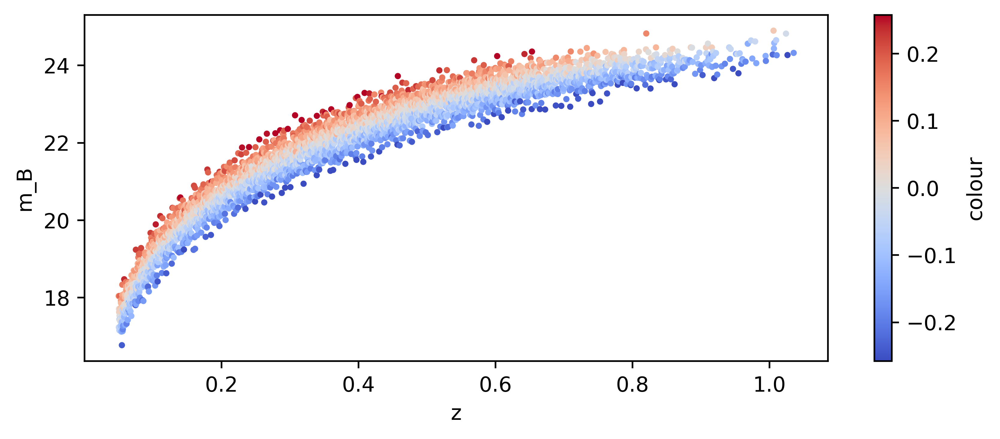

In [162]:
fig, ax = plt.subplots(figsize=(8,3))
h = ax.scatter(data_zs, data_mbs, c=data_cs, cmap="coolwarm")
cbar = plt.colorbar(h)
cbar.set_label("colour")
ax.set_xlabel("z"), ax.set_ylabel("m_B");

Great, so we have "data". If we want to fit it using some importance-sampling ABC method we need to:

1. Create a base simulation
2. Reweight the simulation base on top-level parameters like Om, MB, sigma_int.
3. Compare the data to the re-weighted simulation to get a likelihood.

In [157]:
def get_sim_events(num=100000):
    MBs = uniform.rvs(-21.3, 4, size=num)
    cs = uniform.rvs(-0.5, 0.5, size=num)
    betas = uniform.rvs(2, 4.5, size=num)
    zs = 0.05 + uniform.rvs(size=num)
    # The value here for om doesnt actually matter. Let me delibrately set it 'wrong'
    distmod = FlatLambdaCDM(70, 0.3).distmod(zs).value
    mb = distmod + MBs + betas * cs
    # Emulate some probabilistic selection effect
    mask = (mb + norm.rvs(scale=0.3, size=num)) < 24
    return mb[mask], zs[mask], betas[mask], cs[mask]

sim_mbs, sim_zs, sim_betas, sim_cs = get_sim_events()

Lets check the spread of this broad simulation.

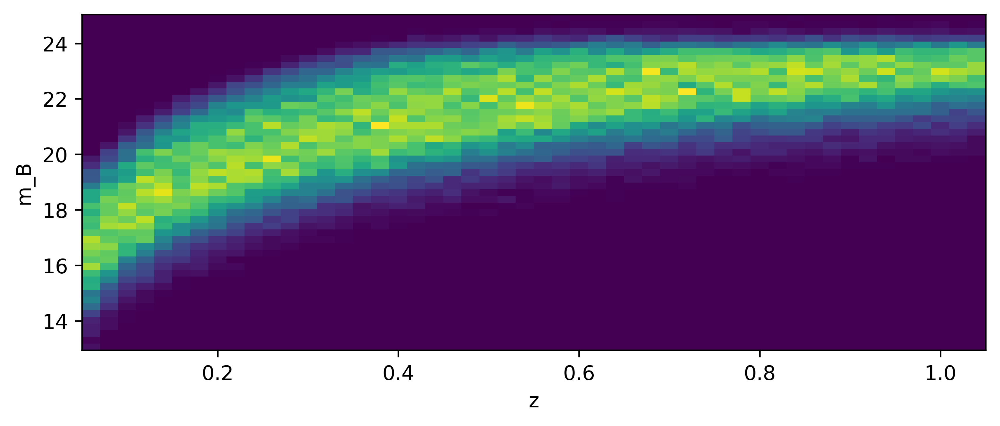

In [158]:
fig, ax = plt.subplots(figsize=(8,3))
ax.hist2d(sim_zs, sim_mbs, bins=50)
ax.set_xlabel("z"), ax.set_ylabel("m_B");

Hopefully, its broad enough. Now to reweight the simulation based on the top-level parameters.

In [180]:
def reweight(sim_mbs, sim_zs, sim_cs, om, MB, sigma_int, mean_c, sigma_c, beta):
    # Step 1: Use om to move from observer frame to rest frame
    distmod = FlatLambdaCDM(70, om).distmod(sim_zs).value
    sim_MBs = sim_mbs - distmod - beta * sim_cs
    # Use top-level parameters to get pdf of simulation points
    weights = norm.logpdf(sim_MBs, MB, sigma_int) + norm.logpdf(sim_cs, mean_c, sigma_c)
    return np.exp(weights)

Right, so we've got this, but it would be good if we could actually do some MCMC on this bad boy. Let's make a likelihood function. For simplicity in this notebook I'm going to break scope.

In [181]:
mb_edges, z_edges, c_edges = np.linspace(13, 26, 31), np.linspace(0.05, 1.05, 31), np.linspace(-0.5, 0.5, 21)
mbc, zc, cc = 0.5 * (mb_edges[:-1] + mb_edges[1:]), 0.5 * (z_edges[:-1] + z_edges[1:]), 0.5 * (c_edges[:-1] + c_edges[1:])

data = np.vstack((data_mbs, data_zs, data_cs)).T
print(data.shape)

(3509, 3)


In [182]:
thresh = 2
hist, _ = np.histogramdd(data, bins=[mb_edges, z_edges, c_edges])
delta_vol = np.diff(mb_edges)[0] * np.diff(z_edges)[0] * np.diff(c_edges)[0]
volume = hist.sum() * delta_vol
hist_err = np.sqrt(hist)
hist_err[hist_err < thresh] = np.inf

hist_err = hist_err / volume
hist = hist / volume
print(hist.shape)

(30, 30, 20)


In [187]:
sim = np.vstack((sim_mbs, sim_zs, sim_cs)).T
sim_count, _ = np.histogramdd(sim, bins=[mb_edges, z_edges, c_edges])
sim_num_err = np.sqrt(sim_count)
sim_num_err[sim_num_err < thresh] = np.inf
sim_err_ratio = sim_num_err / sim_count
sim_err_ratio[sim_count == 0] = np.inf


def get_chi2(x, plot=False):
    om, MB, sigma_int, mean_c, sigma_c, beta = x
    # Add a prior onto MB to help fitting

    weights = reweight(sim_mbs, sim_zs, sim_cs, om, MB, sigma_int, mean_c, sigma_c, beta)
    # Now need a likelihood combining data and simulation. This is super simple, we'd probably 
    # want something like 1712.01293 in a real analysis where we combine MC and Poisson uncert.
    sim_hist, _ = np.histogramdd(sim, bins=[mb_edges, z_edges, c_edges], weights=weights, density=True)
    sim_err = sim_hist * sim_err_ratio
    if plot:
        plt.pcolormesh(mbc, zc, hist.sum(axis=2))
        plt.colorbar()
        plt.title("data")
        plt.show()
        plt.pcolormesh(mbc, zc, sim_hist.sum(axis=2))
        plt.colorbar()
        plt.title("sim")
        plt.show()
        plt.pcolormesh(mbc, zc, (sim_hist - hist).sum(axis=2))
        plt.colorbar()
        plt.title("diff")
        plt.show()
        plt.pcolormesh(mbc, zc, ((sim_hist - hist)**2 / np.sqrt(hist_err**2 + sim_err**2)).sum(axis=2))
        plt.colorbar()
        plt.title("chi2")
        plt.show()
        plt.pcolormesh(mbc, zc, hist_err.sum(axis=2))
        plt.colorbar()
        plt.title("hist err")
        plt.show()
        plt.pcolormesh(mbc, zc, sim_err.sum(axis=2))
        plt.colorbar()
        plt.title("sim err")
        plt.show()
    chi2 = ((sim_hist - hist)**2 / (hist_err**2 + sim_err**2))
    chi2 = np.nan_to_num(chi2, copy=False).sum()
    if np.isnan(chi2):
        print(x)
    return chi2

def get_log_likelihood(x):
    om, MB, sigma_int, mean_c, sigma_c, beta = x
    if not 0.05 < om < 0.5:
        return -np.inf
    if not 0 < sigma_int < 1:
        return -np.inf
    if not -21.3 < MB < -17.3:
        return -np.inf
    if not -0.5 < mean_c < 0.5:
        return -np.inf
    if not 0 < sigma_c < 0.5:
        return -np.inf
    if not 2 < beta < 4.5:
        return -np.inf
    prior = norm.logpdf(MB, -19.3, 1)
    val = -0.5 * get_chi2(x) + prior
    if np.isnan(val):
        return -np.inf
    return val
    

D:\anaconda3\lib\site-packages\ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in multiply


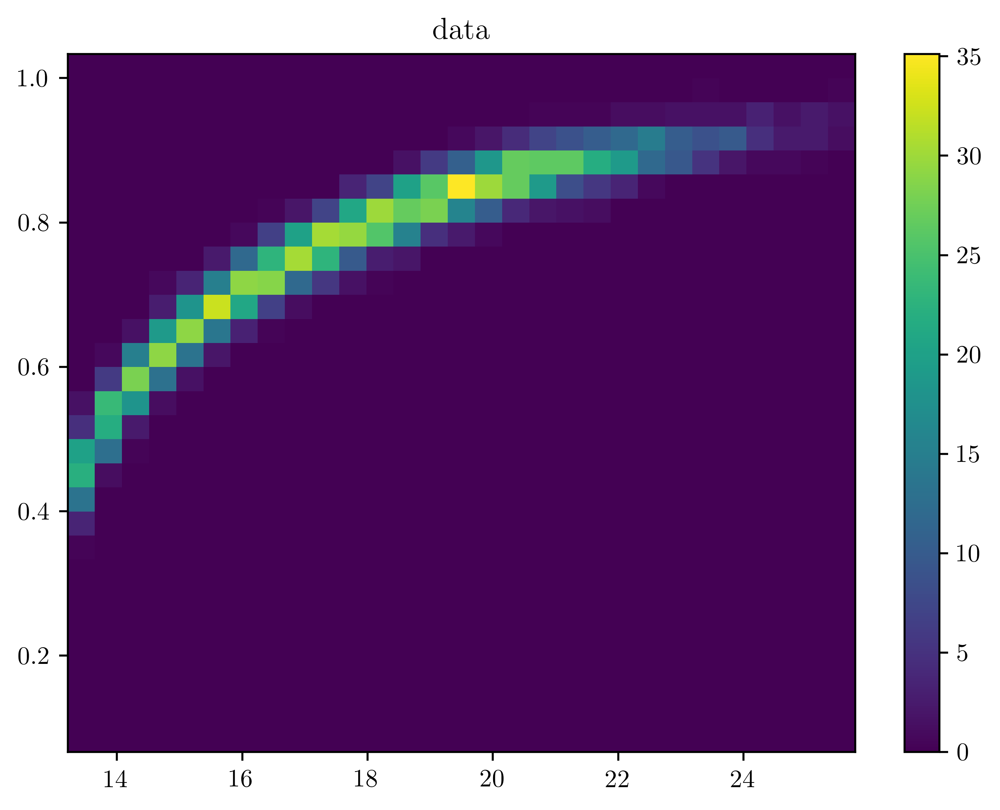

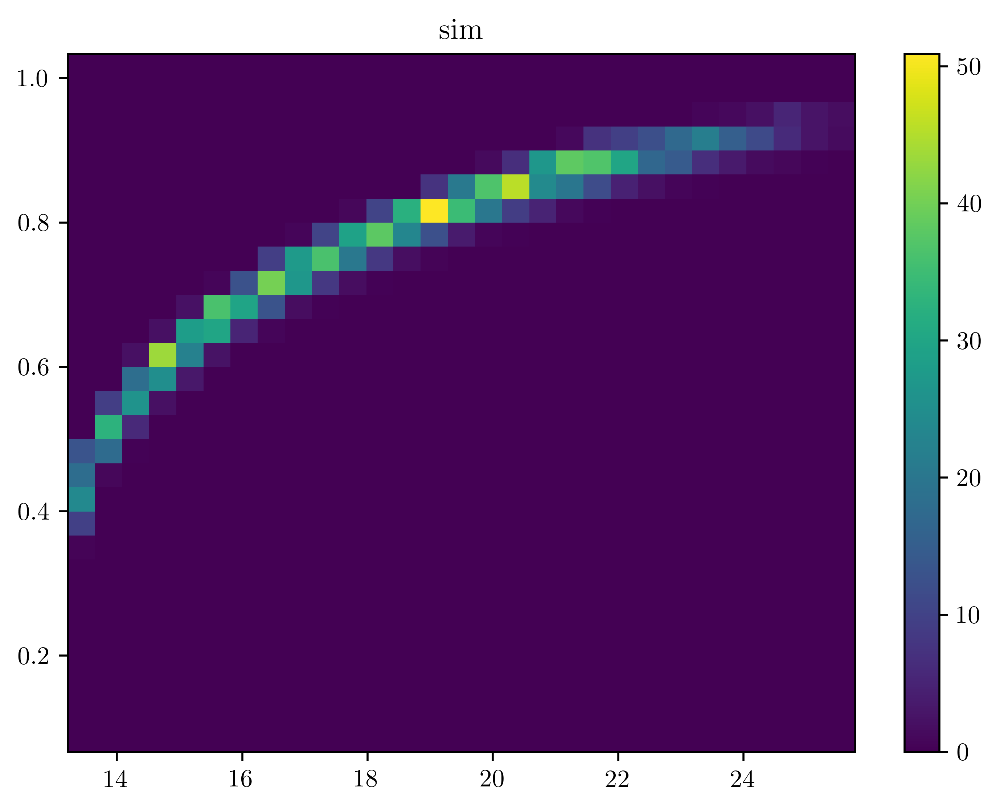

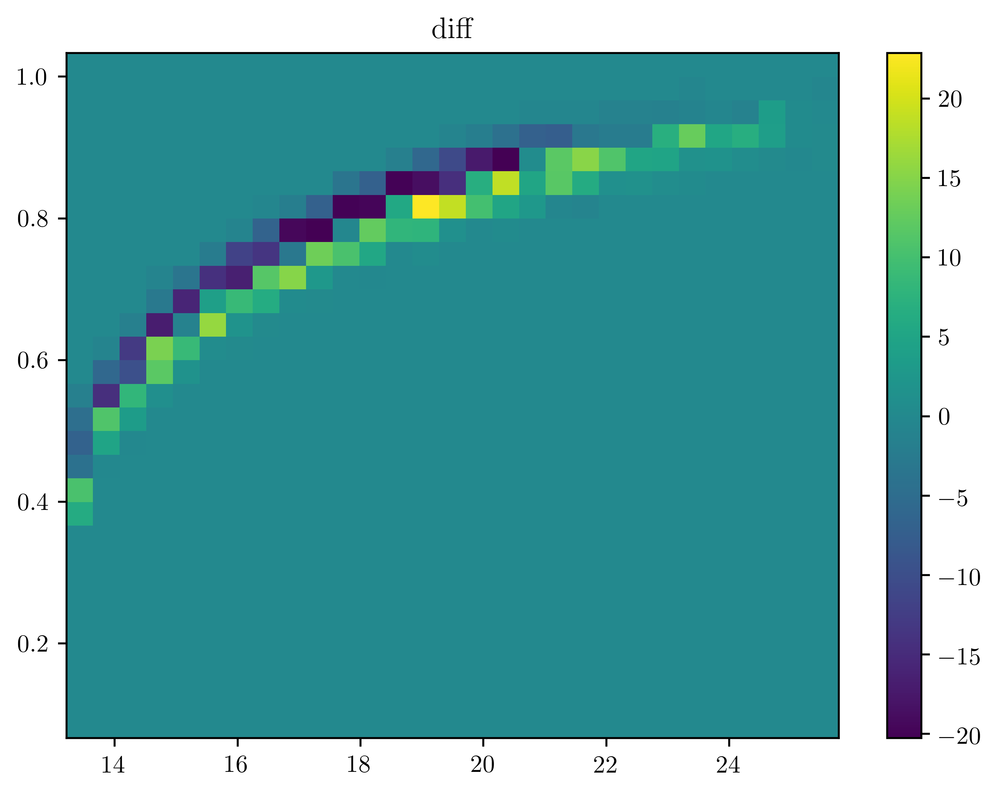

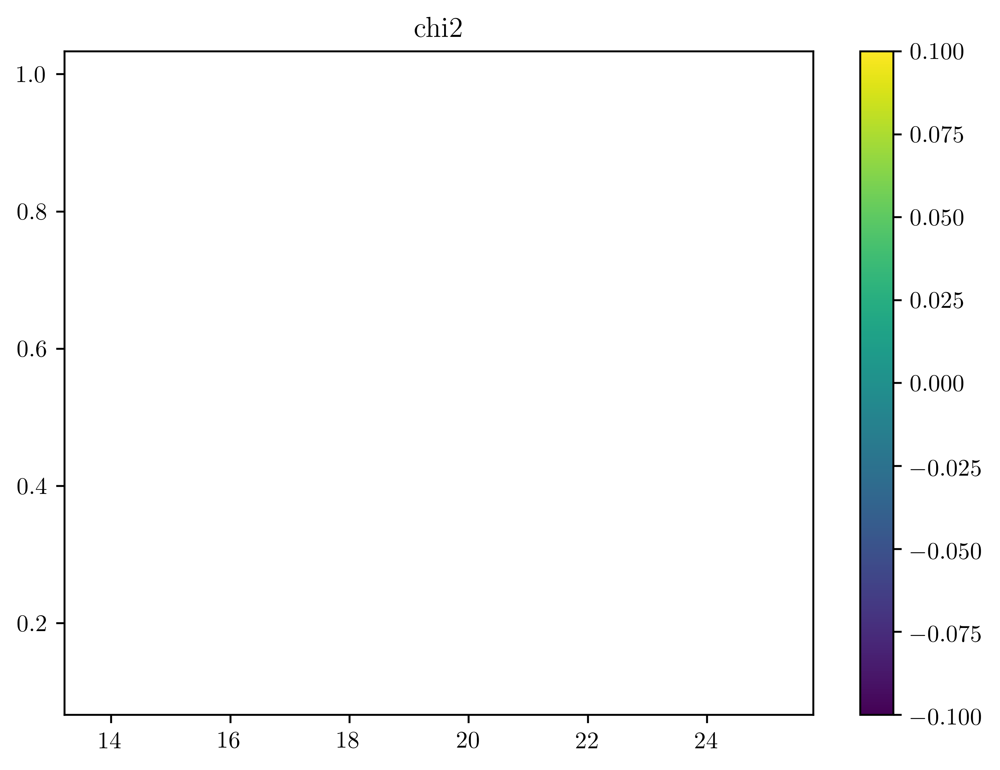

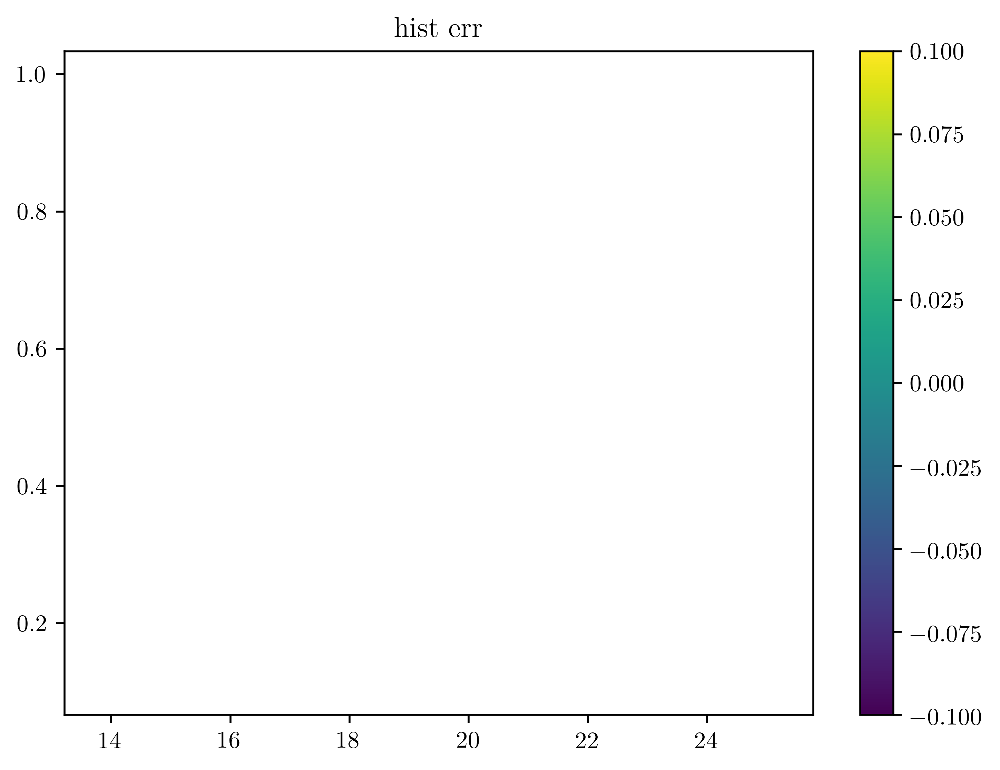

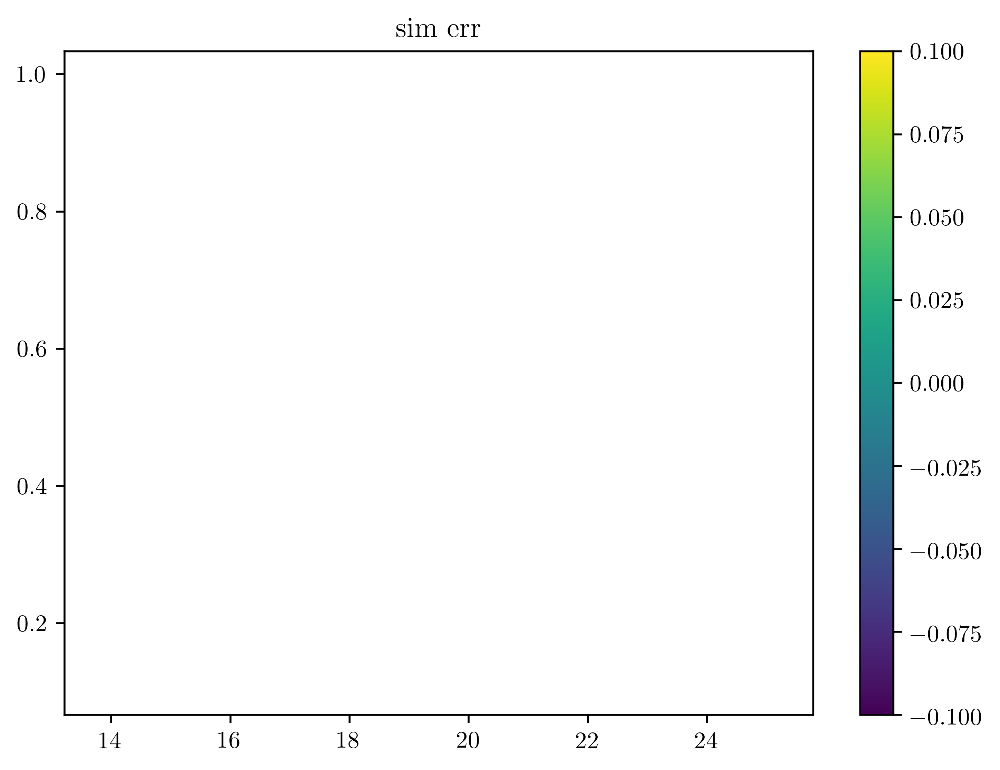

574.2356434269357

In [188]:
get_chi2([0.3, -19.3, 0.1, 0, 0.1, 3.1], plot=True)

Lets check a simple minimisation

In [189]:
test_oms, test_MBs = np.meshgrid(np.linspace(0.1, 0.7, 20), np.linspace(-19.3-1, -19.3+1, 20))
test_oms_flat, test_MBs_flat = test_oms.flatten(), test_MBs.flatten()
test_sigma_int = np.ones(test_oms.size) * 0.1
test_mean_c = np.ones(test_oms.size) * 0.0
test_sigma_c = np.ones(test_oms.size) * 0.1
test_beta = np.ones(test_oms.size) * 3.1

xs = np.vstack((test_oms_flat, test_MBs_flat, test_sigma_int, test_mean_c, test_sigma_c, test_beta)).T
chi2s = np.array([get_chi2(x) for x in xs]).reshape(test_oms.shape)

D:\anaconda3\lib\site-packages\ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in multiply


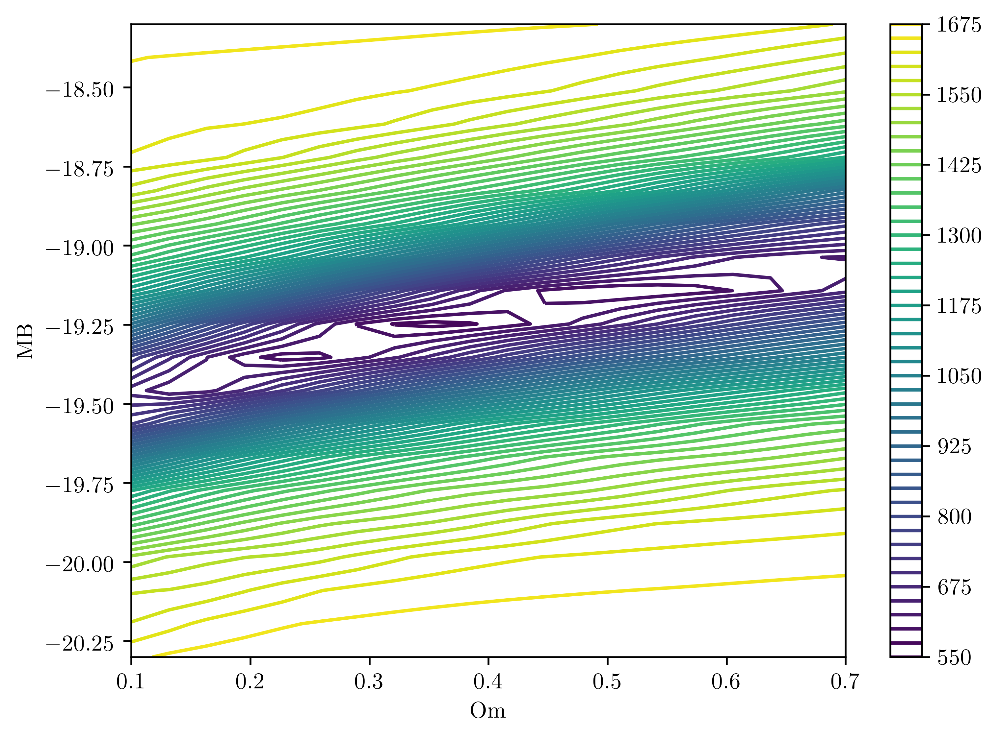

In [190]:
plt.contour(test_oms, test_MBs, chi2s, levels=50)
plt.colorbar(), plt.xlabel("Om"), plt.ylabel("MB");

In [191]:
import emcee
ndim = 6  # How many parameters we are fitting. This is our dimensionality.
nwalkers = 20  # Keep this well above your dimensionality.
p0 = np.random.uniform(low=0.2, high=0.4, size=(nwalkers, ndim))  # Start points
p0[:, 1] += -19
p0[:, 4] -= 0.3
p0[:, 5] += 3
sampler = emcee.EnsembleSampler(nwalkers, ndim, get_log_likelihood)
state = sampler.run_mcmc(p0, 2000)  # Tell each walker to take 4000 steps
chain = sampler.chain[:, 200:, :]  # Throw out the first 200 steps
flat_chain = chain.reshape((-1, ndim))  # Stack the steps from each walker 

D:\anaconda3\lib\site-packages\emcee\ensemble.py:258: RuntimeWarning: Initial state is not linearly independent and it will not allow a full exploration of parameter space
  category=RuntimeWarning,
D:\anaconda3\lib\site-packages\ipykernel_launcher.py:17: RuntimeWarning: invalid value encountered in multiply
D:\anaconda3\lib\site-packages\emcee\moves\red_blue.py:97: RuntimeWarning: invalid value encountered in double_scalars
  lnpdiff = f + nlp - state.log_prob[j]
D:\anaconda3\lib\site-packages\numpy\lib\histograms.py:1118: RuntimeWarning: invalid value encountered in true_divide
  hist /= s


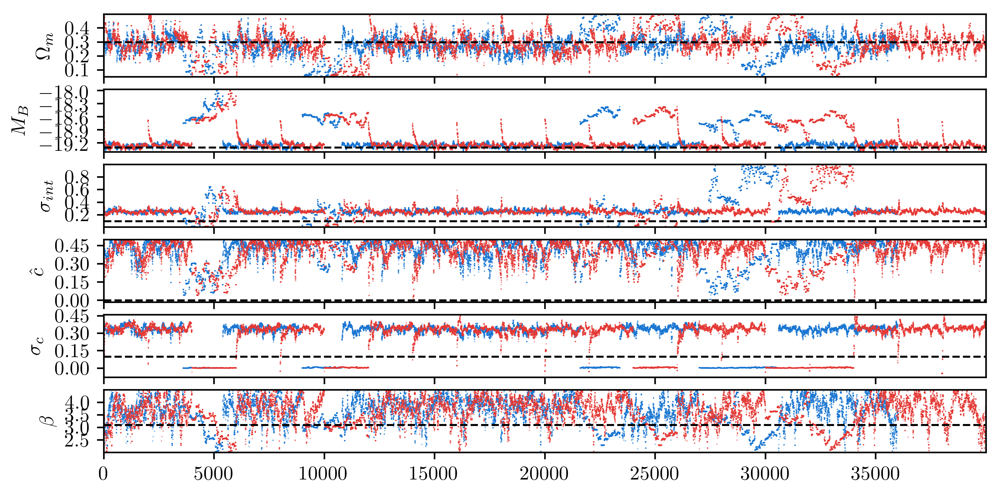

In [192]:
from chainconsumer import ChainConsumer
c = ChainConsumer()
params = [r"$\Omega_m$", "$M_B$", r"$\sigma_{int}$", r"$\hat{c}$", r"$\sigma_c$", r"$\beta$"]
truth = [0.3, -19.3, 0.1, 0, 0.1, 3.1]
c.add_chain(flat_chain, parameters=params, color="b")
c.add_chain(sampler.chain.reshape((-1, ndim)), color="r")
c.plotter.plot_walks(truth=truth, figsize=(8,4));

In [193]:
c = ChainConsumer()
c.add_chain(flat_chain, parameters=params)
c.configure(contour_labels="confidence")
c.plotter.plot(truth=truth, figsize=2.0)
summary = c.analysis.get_summary()
for key, value in summary.items():
    print(key, value)

$\Omega_m$ [0.20022401946644214, 0.2686007451187208, 0.3648890638595272]
$M_B$ [-19.344040313858205, -19.25788472189105, -19.17701562561674]
$\sigma_{int}$ [0.20823623956088752, 0.2498037969125661, 0.2938280656916489]
$\hat{c}$ [None, 0.49877424015495503, None]
$\sigma_c$ [None, 0.0013242166031414314, None]
$\beta$ [3.1882083191586057, 3.8852020224786785, 4.360943632075796]
